<a href="https://colab.research.google.com/github/olorunfemibabalola/Computer-Vision-Learning/blob/main/02_OpenCV_template_matching.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data & imports

Let's download the data first.We are using the `gdown` shell command for this. You can actually run *any* shell command from inside a notebook using the `!<command>` notation.


In [ ]:
!gdown https://drive.google.com/uc?id=19nRYZZRy1BeswhwKUb_6A4gNtBvX8KG2 -O "03-files.zip"
!unzip -o 03-files.zip

Downloading...
From: https://drive.google.com/uc?id=19nRYZZRy1BeswhwKUb_6A4gNtBvX8KG2
To: /content/03-files.zip
100% 3.82M/3.82M [00:00<00:00, 190MB/s]
Archive:  03-files.zip
   creating: 03-files/
  inflating: 03-files/waldo_templ_hires.png  
  inflating: __MACOSX/03-files/._waldo_templ_hires.png  
  inflating: 03-files/wally2.jpg     
  inflating: __MACOSX/03-files/._wally2.jpg  
  inflating: 03-files/wally1.jpg     
  inflating: __MACOSX/03-files/._wally1.jpg  
  inflating: 03-files/waldo1.jpg     
  inflating: __MACOSX/03-files/._waldo1.jpg  
  inflating: 03-files/waldo0.jpg     
  inflating: __MACOSX/03-files/._waldo0.jpg  
  inflating: 03-files/waldo2.jpg     
  inflating: __MACOSX/03-files/._waldo2.jpg  
   creating: 03-files/.vscode/
  inflating: 03-files/waldo_templ2.png  
  inflating: __MACOSX/03-files/._waldo_templ2.png  
  inflating: 03-files/waldo_templ3.png  
  inflating: __MACOSX/03-files/._waldo_templ3.png  
  inflating: 03-files/waldo_templ1.png  
  inflating: __MACOSX

We will be using [OpenCV](https://opencv.org/), an open source computer vision and machine learning software library. OpenCV was built to provide a common infrastructure for computer vision applications and to accelerate the use of machine perception in the commercial products. The library has more than 2500 optimized algorithms, which includes a comprehensive set of both classic and state-of-the-art computer vision and machine learning algorithms.

A super useful library you might not have heard about is TQDM - see https://tqdm.github.io/:

In [ ]:
import cv2 # why cv2?
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.auto import trange

# Image reading, displaying and resizing

Read image from file using OpenCV - virtually all image file types you can think of are supported (raster only). One thing to be aware of: if the file can't be found or read, OpenCV *will not* throw an exception but rather set the output to `None`.

In [ ]:
im = cv2.imread('03-files/wally1.jpg')

In [ ]:
type(im), im.dtype, im.shape # what does the shape mean (WxH vs HxW)? what is uint8? what is the 3rd dimension?

(numpy.ndarray, dtype('uint8'), (726, 968, 3))

In [ ]:
im_none = cv2.imread('nonexistent_file.jpg')
print(im_none)

None


A computer represents everything with numbers. Images are not an exception! What do [these numbers actually mean](https://livebournemouthac-my.sharepoint.com/:x:/g/personal/mbudka_bournemouth_ac_uk/ERFapZpBh3FGhFDscsdJ4EkB0YnrjJH1Ft1vb5cfI6Zq1w?e=jkriDo) though?

In [ ]:
im[:3,:3] # what do these numbers mean? uint8 vs float

array([[[244, 245, 243],
        [244, 245, 243],
        [244, 244, 244]],

       [[244, 244, 244],
        [244, 244, 244],
        [244, 243, 245]],

       [[244, 242, 248],
        [244, 242, 248],
        [244, 242, 248]]], dtype=uint8)

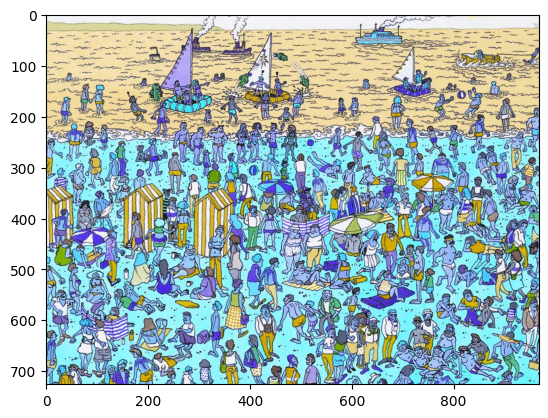

In [ ]:
plt.imshow(im);

The image above has this weird blue-ish tint. This is because OpenCV uses the *BGR* channel order, for historical reasons (first digital cameras used BGR).

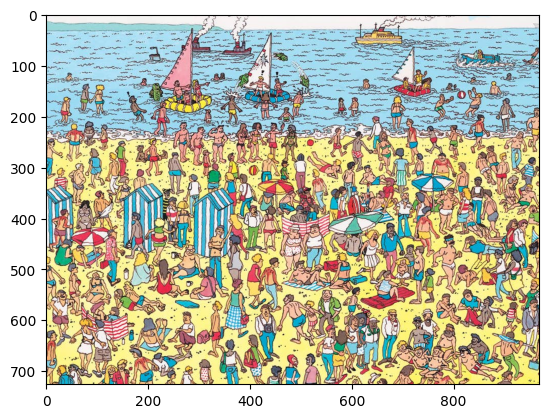

In [ ]:
plt.imshow(im[:,:,::-1]); # handy indexing trick ::-1
# in general slicing looks like this: array[start_ix:stop_ix:step]
# if any of these is ommitted, they take on default values i.e. start_ix=0, end_ix=-1, step=1

As we'll be displaying images a lot, let's create a convenience function for that:

In [ ]:
def show_img(im, ax=None, figsize=(8,8)):
    if not ax: _,ax = plt.subplots(1,1,figsize=figsize) # what does the _ mean?
    if len(im.shape)==2: im = np.tile(im[:,:,None], 3)  # handle greyscale images
    ax.imshow(im[:,:,::-1])  # BGR → RGB
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    return ax

((726, 968, 3), np.int64(2108304))

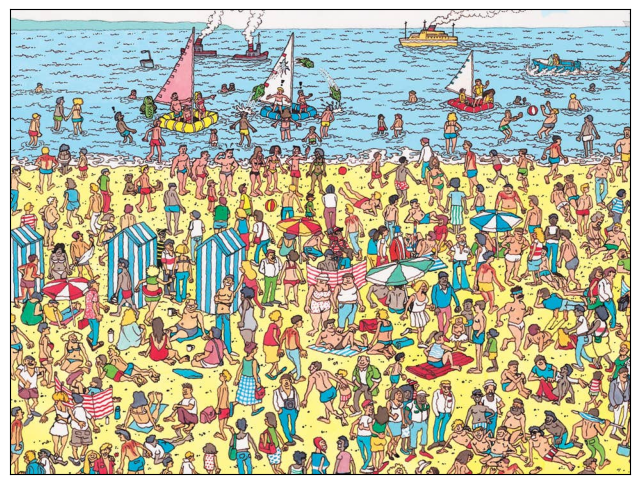

In [ ]:
show_img(im);
im.shape, np.prod(im.shape)

In [ ]:
im_r = cv2.resize(im, None, fx=0.5, fy=0.5)  # how much to resize? (large image → slow processing, don't use a bigger image than needed)
im_r.shape, np.prod(im_r.shape)

((363, 484, 3), np.int64(527076))

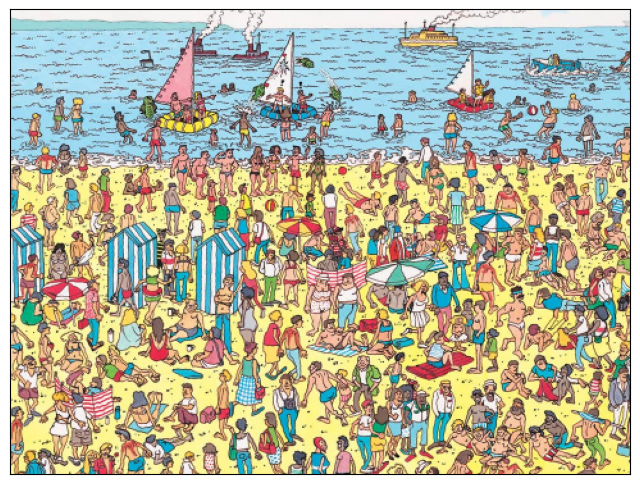

In [ ]:
show_img(im_r);

# Template matching
Template Matching is a method for searching and finding the location of a template image in a **larger image**.

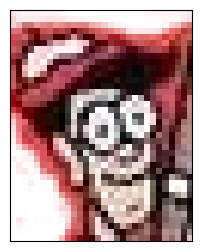

In [ ]:
templ = cv2.imread('03-files/waldo_templ3.png')
show_img(templ, figsize=(3,3));

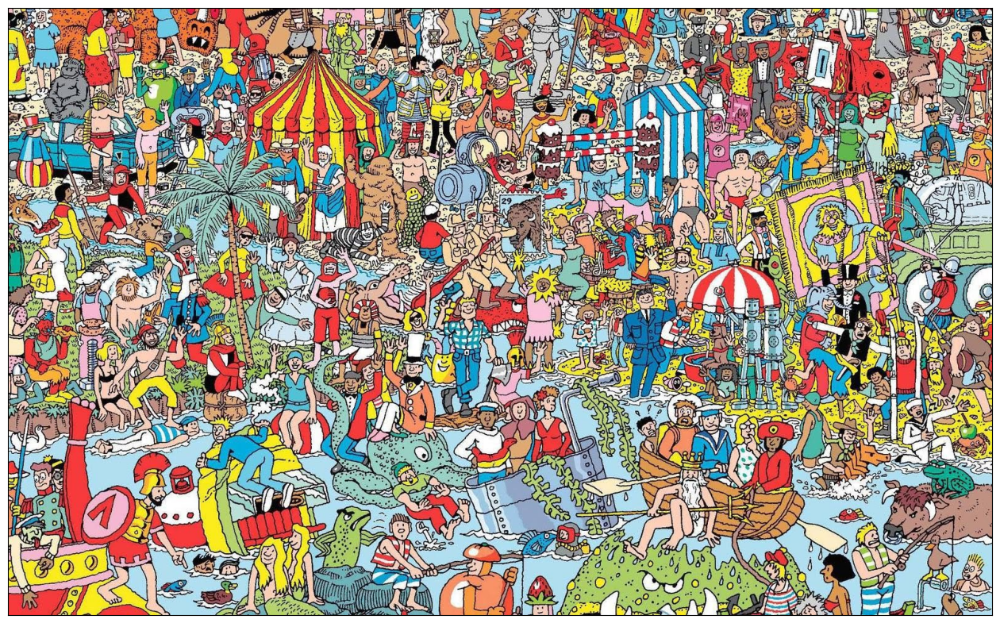

In [ ]:
im = cv2.imread('03-files/waldo1.jpg')
show_img(im, figsize=(16,16));

Who can see Wally in the image above??

In [ ]:
H,W = im.shape[:2]
print(f'{W} x {H}')
h,w = templ.shape[:2]
print(f'{w} x {h}')

1590 x 981
30 x 38


## Sliding window with loops

In [ ]:
%%time
stride = 1 # try 1,2,3,4...

scores = np.zeros((H-h+1, W-w+1))
for x in trange(0,W-w+1,stride):   # trange in action (no, this is not a typo!)
    for y in range(0,H-h+1,stride):
        patch = im[y:y+h,x:x+w]
        scores[y,x] = (patch==templ).mean()  # many different options for quantifying the similarity
        # what would be the value of scores[y,x] if we found a perfect match?

  0%|          | 0/1561 [00:00<?, ?it/s]

CPU times: user 23.7 s, sys: 270 ms, total: 24 s
Wall time: 24.5 s


The loop approach above is quite slow - takes around 22 seconds to find 1 Wally in 1 image! What about a self-driving car which needs to find say 30 different types of objects in an image 30 times per second?

In [ ]:
scores.min(), scores.max()  # do we want the scrore to be big or small?

(np.float64(0.00029239766081871346), np.float64(0.1956140350877193))

In [ ]:
# max vs argmax
y_max, x_max = np.unravel_index(scores.argmax(), scores.shape)  # argmax gives flat index
y_max, x_max

(np.int64(74), np.int64(1262))

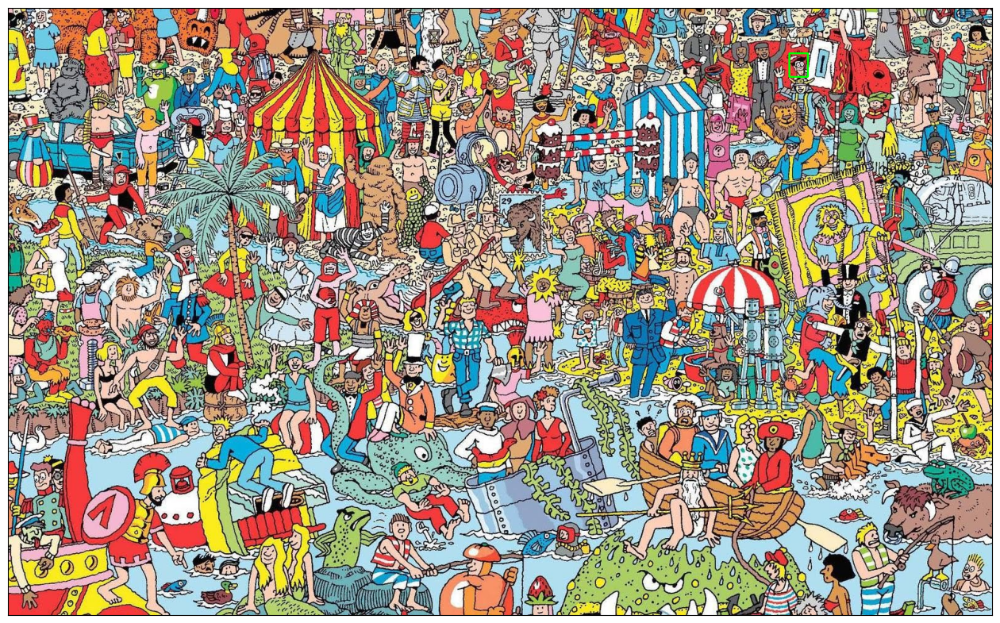

In [ ]:
im_copy = im.copy()
cv2.rectangle(im_copy, (x_max,y_max),(x_max+w,y_max+h), color=(0,255,0), thickness=2)
show_img(im_copy, figsize=(16,16));

We can make it all faster by increasing stride, but there is a trade-off.

## Sliding window with OpenCV `matchTemplate`
OpenCV has a special `matchTemplate` function which can be used for what we have just done. The documentation can be found [here](https://docs.opencv.org/4.2.0/df/dfb/group__imgproc__object.html#ga586ebfb0a7fb604b35a23d85391329be).

In [ ]:
def match_img(im, templ, method=cv2.TM_SQDIFF_NORMED):
    scores = cv2.matchTemplate(im, templ, method)
    # for some scoring functions a higher score denotes a better match, for others - lower score
    if method in [cv2.TM_SQDIFF_NORMED, cv2.TM_SQDIFF]: scores = -scores
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(scores)  # thanks to this function we don't need to do the unravel_index() thing
    print(f'max score = {max_val:.3}')
    return max_loc,scores

In [ ]:
%%time
max_loc,scores = match_img(im, templ)  # much faster but is this fast enough for a self driving car?

max score = -0.194
CPU times: user 241 ms, sys: 39 ms, total: 280 ms
Wall time: 310 ms


In [ ]:
def show_matches(im, max_loc, scores):
    im_copy = im.copy()
    top_left, btm_right = max_loc, (max_loc[0] + w, max_loc[1] + h)
    cv2.rectangle(im_copy,top_left,btm_right,(0,255,0), 3)
    fig,ax = plt.subplots(1,2,figsize=(24,20))
    ax[0].imshow(im_copy[:,:,::-1])
    im_scores = ax[1].imshow(scores,cmap='gray')
    [(ax_.xaxis.set_visible(False), ax_.yaxis.set_visible(False)) for ax_ in ax]
    # fig.colorbar(im_scores,orientation='vertical')
    return fig,ax

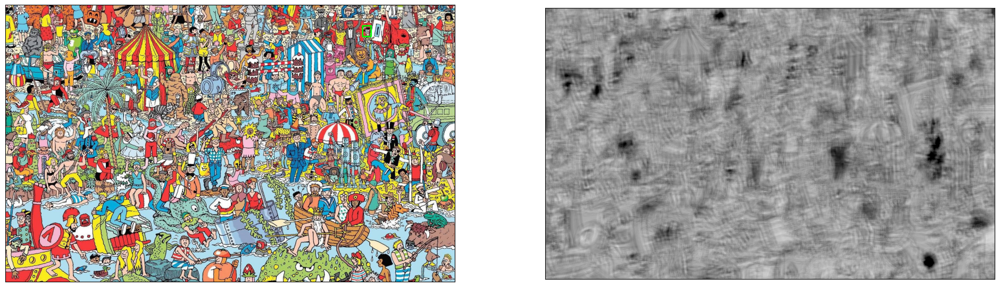

In [ ]:
show_matches(im, max_loc, scores);

What if we can't find a perfect match?

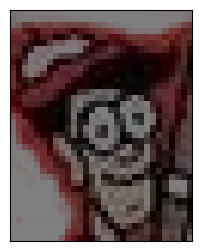

In [ ]:
alpha = 0.5   # contrast
beta = 0      # brightness
templ1 = np.clip(alpha * templ + beta, 0, 255).astype('uint8')
show_img(templ1, figsize=(3,3));

max score = -0.433


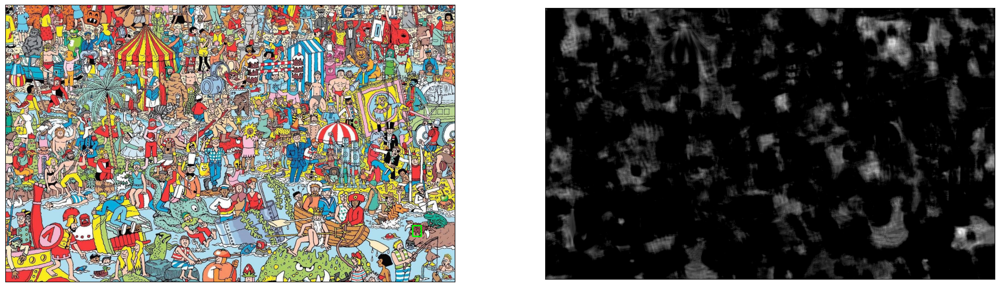

In [ ]:
show_matches(im, *match_img(im, templ1));

# "*" is the operator which unpacks an iterable; the above is equivalent to:
# o1,o2 = match_img(im, templ1)
# show_matches(im, o1, o2)

### Matching methods

Referring to the [documentation](https://docs.opencv.org/4.2.0/df/dfb/group__imgproc__object.html#ga586ebfb0a7fb604b35a23d85391329be), there are 6 methods that could be used for matching:
- `cv2.TM_SQDIFF` and `cv2.TM_SQDIFF_NORMED` (Sum of Squared Differences)
- `cv2.TM_CCORR` and `cv2.TM_CCORR_NORMED` (Cross Correlation)
- `cv2.TM_CCOEFF` and `cv2.TM_CCOEFF_NORMED` (Pearson Correlation Coefficient)

An excellent post describing all of these can be found [here](https://stackoverflow.com/questions/58158129/understanding-and-evaluating-template-matching-methods/58160295#58160295).

In [ ]:
methods = [cv2.TM_SQDIFF_NORMED, cv2.TM_CCORR_NORMED, cv2.TM_CCOEFF_NORMED]
[show_matches(im, *match_img(im, templ1, method)) for method in methods];

max score = -0.433
max score = 0.919
max score = 0.746


How robust is correlation? Will a very dark image make it more difficult?

In [ ]:
alpha = 0.5    # contrast
beta =  0      # brightness
templ2 = np.clip(alpha * templ + beta, 0, 255).astype('uint8')
show_img(templ2, figsize=(4,4));

In [ ]:
show_matches(im, *match_img(im, templ2, cv2.TM_CCOEFF_NORMED));

In [ ]:
templ1_gray = np.tile(templ1.mean(axis=-1,keepdims=True).astype('uint8'), (1,1,3))
show_img(templ1_gray, figsize=(4,4));
show_matches(im, *match_img(im, templ1_gray, cv2.TM_CCOEFF_NORMED));

# Image pyramids
What if the template and the object in the image have different sizes?

In [ ]:
templ = cv2.imread('03-files/waldo_templ3.png')
h,w = templ.shape[:2]
print(w,h)
show_img(templ, figsize=(3,3));

In [ ]:
im = cv2.imread('03-files/waldo2.jpg')
show_matches(im, *match_img(im, templ, cv2.TM_CCOEFF_NORMED));

Image pyramid is a *multiscale* representation of an image - looking at the image below the name *pyramid* is self-explanatory. The pyramid is built by starting with original image and then iteratively resampling/rescaling it - typically downsizing. Before resampling the image is also blurred to reduce aliasing artefacts.

![](https://upload.wikimedia.org/wikipedia/commons/thumb/4/43/Image_pyramid.svg/600px-Image_pyramid.svg.png)

There's a trade-off here - if you reduce the resolution too quickly, you may miss the object.

In [ ]:
im_copy = im.copy()

for i in range(5):
    im_copy = cv2.pyrDown(im_copy)
    print(im_copy.shape)
    show_img(im_copy, figsize=((5-i)*2, (5-i)*2))

# Multiscale template matching
Let's now put the last two parts together.

In [ ]:
im_copy = im.copy()

for i in range(6):
    max_loc,scores = match_img(im_copy, templ, cv2.TM_CCOEFF_NORMED)
    show_matches(im_copy, max_loc, scores)
    im_copy = cv2.pyrDown(im_copy)

How do we know however at which scale we have found the match?

In [ ]:
def match_img2(im, templ, method=cv2.TM_SQDIFF_NORMED):
    scores = cv2.matchTemplate(im, templ, method)
    if method in [cv2.TM_SQDIFF_NORMED, cv2.TM_SQDIFF]: scores = -scores
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(scores)
    return max_loc,scores,max_val  # <= we are now returning the max value too
    # return max_loc,scores  # this was the original match_img() function

In [ ]:
def match_multiscale(im, templ):
    im_copy = im.copy()
    matches = []
    while np.all(np.array(im_copy.shape[:2]) >= np.array(templ.shape[:2])):  # loop as long as the image is larger than the template
        max_loc,_,max_val = match_img2(im_copy, templ, cv2.TM_CCOEFF_NORMED)
        matches.append((max_loc,max_val))
        im_copy = cv2.pyrDown(im_copy)
    return matches

In [ ]:
matches = match_multiscale(im, templ)
matches # something doesn't seem right!

Turns out, that if we run edge detection on both the image and the template and work with these images instead, the whole matching will become more robust:

In [ ]:
im_gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
im_edged = cv2.Canny(im_gray, 50, 150)

templ_gray = cv2.cvtColor(templ, cv2.COLOR_BGR2GRAY)
templ_edged = cv2.Canny(templ_gray, 50, 150)

show_img(im_edged);
show_img(templ_edged);

In [ ]:
matches = match_multiscale(im_edged, templ_edged)
matches # now it's better; we have added a layer of robustness!

The approach has a number of limitations:
- it doesn't tell you if the template appears in the image or not; it will always match *something* - thresholding is the only solution here
- it can't handle rotated template - although such an approach is possible (see homework)
- it can't handle other affine (like shear) and non-affine transformations
- it is slow if you want to match multiple templates (e.g. detecting different types of objects)


# Homework/labwork

## For all (in the labs)

Modify this notebook to allow for rotation invariance; one approach is to add another loop to the `match_multiscale` function, which will rotate the template by a range of angles and try to match it against the image.